***
#### About this document
This is the assignment for the UCL CASA module Data Science for Spatial Systems (CASA0006) <br>

It will take about 5 mins to run all the code from the beginning. To quickly rerun all the code chunks, please refer to the [Quick-run Code](https://github.com/yiyansun/spatial-ds/blob/main/code_run&print.ipynb)

**Word count**: 1994<br>
**Full Code is hosted [here](https://github.com/yiyansun/spatial-ds/blob/main/code_full.ipynb)**<br>
**Quick-run Code is hosted [here](https://github.com/yiyansun/spatial-ds/blob/main/code_run&print.ipynb)**<br>
**Data is availble [here](https://github.com/yiyansun/spatial-ds/tree/main/data)**
***

# Nonlinear Effects of Public Transport Accessibility on Urban Development: 
<p style="color:DimGray; text-align:left; font-size:20px"><i> the case of Chongqing City </i></p>
<a id="ID_title"></a>

<p style="color:DimGray; text-align:left;"><i> The study explores the nonlinear effects of public transport accessibility on the urban development of Chongqing, a mountainous city in China. Based on Chongqing's metro service areas (MSAs) and big open data, point-of-interest (POI) data obtained from the Map Application Programming Interface (API) has been used to represent the level of urban development. Comprehensive city, road, and metro maps, including data from open street map and other data sources, were utilized to procure information on road and metro accessibility. Employing Gradient Boosting Decision Trees (GBDT), a supervised machine-learning technique, the study effectively evaluates the accessibility of public transport in Chongqing by examining the nonlinear interplay between public transportation accessibility and urban development.</i></p>

In [1]:
import sys
print(sys.version)

3.11.5 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:26:23) [MSC v.1916 64 bit (AMD64)]


In [96]:

# Data manipulation and analysis
import os
import re
import json
import csv
import urllib.request
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np

# Data visualization
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as cx
from PIL import Image
from io import BytesIO

# Geospatial data processing
from shapely.geometry import Point, LineString, Polygon, LinearRing
from shapely.geometry import shape, MultiPolygon, MultiLineString, MultiPoint
import networkx as nx

# Machine learning and data preprocessing
import sklearn
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_val_predict, GridSearchCV, cross_validate
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression
import statsmodels
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.outliers_influence import OLSInfluence
from lightgbm import LGBMRegressor
import shap

# Utility
import joblib
from glob import glob
from ChangeCoordinate import ChangeCoord
import requests



---

<a id="ID_intr"></a>
| [1.0 Intro](#ID_intr) | [2.0 Research Question](#ID_quest) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |

## 1.0 | Introduction

### 1.1 Effects of public transport systems on urban development patterns


Public transport investments play a pivotal role in shaping urban form and land use, influencing various aspects of urban development and sustainability.  Some studies highlight how high-capacity transit enables more compact, high-density urban development by reducing reliance on automobiles (Hurst, 2011; Knowles, 2012). Others examine public transport's role in achieving sustainable urbanization goals like reducing energy use, air pollution, and traffic congestion (Sharma and Patil, 2022;Rode et al., 2017). The concept of transit-oriented development (TOD) has emerged as a key strategy for promoting sustainable urban growth, focusing on intensive, mixed-use development centered around transit nodes to encourage public transport use (Calthorpe, 1993). While early TOD research focused on impacts to travel behavior, more recent work has analyzed effects on urban development intensity, accessibility and economic development (Kamruzzaman et al., 2014; Dong, 2016). 

Many studies have traditionally assumed linear relationships between transit accessibility metrics and indicators of urban development, such as employment and population densities, as well as concentrations of points of interest (Xiao et al., 2021; Zhou and Yang, 2021). However, the potential for nonlinear effects in this relationship has been relatively underexplored (Xu and Yang, 2019). Thus, it is essential to explore the possibility of nonlinear associations, where the marginal impacts of transit accessibility on urban development may diminish or accelerate beyond certain thresholds.


### 1.2 Public Transit Accessibility Evaluation


The concept of accessibility, defined as the ease of reaching desired destinations and activities from a given location, serves as a critical determinant of both transit ridership levels and land use dynamics (Geurs & van Eck, 2001). Scholars have developed a variety of methodologies to evaluate public transit accessibility, typically grounded in the spatial distributions of transit stops/stations, service frequencies, travel duration times, and the destinations (Mavoa et al., 2012).Empirical evidence indicates that higher levels of transit accessibility are associated with more compact urban development patterns and increased real estate valuations (Wang et al., 2015; Gong, 2021). However, the relationship between transit accessibility and urban development may be influenced by factors such as a city's spatial structure, predominant transit modes, and physical geography. While much research has focused on monocentric cities in flat terrain, where accessibility exhibits a distance-decay pattern from the central business district (CBD), less attention has been paid to mountainous or polycentric cities with dispersed development patterns (Hickman and Hall, 2008).

Although new big data sources offer opportunities to measure the built environment and human activities, much TOD research still relies on traditional data sources like population/employment statistics, which may not fully capture urban development patterns. Employing Gradient Boosting Decision Trees (GBDT) with open big data, the study effectively evaluates the accessibility of public transport in Chongqing by examining the nonlinear relationship between public transportation accessibility and urban development.


<a id="ID_quest"></a>
| [1.0 Intro](#ID_intr) | [2.0 Research Question](#ID_quest) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |

## 2.0 | Research Question

- What is the relationship between public transport accessibility and urban development in mountainous cities like Chongqing?

- What are the specific impacts of different modes of public transport (e.g., metro, bus, street accessibility) on urban development?


<a id="ID_method"></a>
| [1.0 Intro](#ID_intr) | [2.0 Research Question](#ID_quest) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |

## 3.0 | Methodology



To investigate the relationship between public transport accessibility and urban development levels in the mountainous city of Chongqing, this study employs a data-driven analytical approach combining big data sources, machine learning algorithms, and interpretable modeling techniques. We utilize the Gradient Boosting Decision Tree (GBDT) machine learning algorithm to capture the nonlinear relationships between public transit accessibility and urban development levels. GBDT is an ensemble method that incrementally combines weak regression tree models to optimize predictive performance. Crucial advantages include high accuracy, ability to automatically handle non-linearities and interactions, and inbuilt prevention of overfitting.

To interpret the resulting GBDT model's nonlinear effects and each variable's relative importance, a method called SHapley Additive exPlanations (SHAP) is used. SHAP computes Shapley values, a game theory-based approach to fairly distribute the prediction among feature contributions. Visual techniques like dependency plots are then employed to scrutinize variable influence across their data ranges.





The regression decision tree partitions the input data recursively into smaller regions and maps them to response values. For a training set $D = \{(x_1,y_1),(x_2,y_2),...,(x_N,y_N)\}$ where $x_i \in \chi$, $y_i \in \mathbb{R}^n$, $c$ as a constant, and $j$ as a leaf node, each regression tree $f(x)$ can be represented as:

$$
f(x) = T(x:\theta) = \sum_{j=1}^J c_j I(x \in R_k) \quad (1)
$$

Here, $I$ is the indicator function and $R_k$ represents the regions the input space is divided into. The goal is to find $\hat{f}(x)$ that minimizes the loss function $L(y,F(x))$. For regression trees, the square error loss is typically used:

$$
L(y,f(x)) = \frac{1}{n} \sum_{i=1}^n (f(x) - y)^2 \quad (2)
$$

where $y$ is the true value. GBDT is an additive model composed of $M$ trees:

$$
f_M(x) = \sum_{m=1}^M T(x:\theta_m) \quad (3)
$$

Assuming $f_0(x) = 0$, the boosted tree after $m$ iterations is given by:

$$
f_m(x) = f_{m-1}(x) + T(x:\theta_m) \quad m=1,2,...,M \quad (4)
$$

The parameters $\theta_m$ are determined by minimizing the loss function:

$$
\hat{\theta}_m = \text{argmin}(\theta_m) \sum_{i=1}^N L(y_i, f_{m-1}(x_i) + T(x_i:\theta_m)) \quad (5)
$$



Shrinkage introduces a learning rate $0 < \xi \leq 1$ to control the contribution of each tree:

$$
f_m(x) = f_{m-1}(x) + \xi \cdot T(x:\theta_m) \quad (6)
$$

The Light Gradient Boosting Machine (LightGBM) implementation is employed, leveraging gradient-based one-side sampling and exclusive feature bundling to enhance efficiency.

<a id="ID_data"></a>
| [1.0 Intro](#ID_intr) | [2.0 Research Question](#ID_quest) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |
## 4.0 | Datasets


We collected data in year 2024, and the indicator system utilized in this study was tailored to the particular context after being derived from the one used in Shenzhen (Xiao et al., 2021).

| Variables category      | Variable                    | Description                                                                                     | Data source                                                     |
|-------------------------|-----------------------------|-------------------------------------------------------------------------------------------------|-----------------------------------------------------------------|
| Urban development       | POI                         | Point of interest data, including restaurants, shopping centers, businesses, leisure, medical services, real estate, and schools. | Amap                                                            |
| Metro accessibility     | Network accessibility by distance | Overall accessibility of a metro station to others, accounting for distance.                   | [Transport](https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=d39b1ec75e5f1f9033b1bc00952c4ced&output=json&city=重庆&offset=2&keywords=轨道交通1号线&platform=JS) |
| Metro accessibility     | Betweenness                 | The frequency with which a subway station is traversed on the shortest route between any two stations. | Calculated                                                      |
| Metro accessibility     | Closeness                   | The average distance between a subway station and all other subway stations.                     | Calculated                                                      |
| Street accessibility    | 30% Street Bt               | The percentage of streets with Bt values in the top 30% in an MSA.                               | [OpenStreetMap](https://www.openstreetmap.org/#map=9/29.4661/106.6205) |
| Transit accessibility   | Bus stops                   | The number of bus stops within each MSA.                                                       | [Chongqing Bus data](https://www.cqgj.net/#/)                   |
| Transit accessibility   | Time to CBD                 | Average travel time from a station to the central business district by metro or bus.             | [CityLines](https://www.citylines.co/)                         |
| Station characteristics| CBD                         | Indicates if the station falls within an official Central Business District (CBD) area. (1 = yes, 0 = no) | Chongqing city planning doc                                 |
| Station characteristics| Transfer station            | Identifies if the station serves as a transfer point between different lines or modes of transportation. (1 = yes, 0 = no) | Calculated                                                  |
| Control variable        | Average housing price       | Average housing price in the MSA.                                                               | [LianJia housing website](https://yibin.lianjia.com/)          |
| Boundary data           | Chongqing city boundary     |                                                                                                 | [GADM](https://gadm.org/data.html#/google_vignette)            |


| Variables category         | Variable      | Description    |  Data source|
|--------------------|------------|---------------------------------------------------------------------------------|-------|
| Urban development | POI| Point of interest data, contains restaurants, shopping centers, businesses, leisure entertainment, life sevices, medical services, real estate, and schools. | Amap|
|Metro accessibility | Network accessibility by distance| Overall accessibility of a metro station to others, accounting for distance.| [Tranport]((https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=d39b1ec75e5f1f9033b1bc00952c4ced&output=json&city=重庆&offset=2&keywords=轨道交通1号线&platform=JS)) |
| Metro accessibility | Betweenness | The frequency with which a subway station is traversed on the shortest route between any two stations.|Calculated|
| Metro accessibility| Closeness | The average distance between a subway station and all other subway stations.|Calculated|
| Street accessibility| 30 % Street Bt| 	The percentage of an MSA's streets with Bt values in the top 30%. The term "betweenness" refers to the number of times a link's midpoint follows the shortest path between any two street segments (where the distance is less than 600 meters).| [Open street map](https://www.openstreetmap.org/#map=9/29.4661/106.6205)|
| Transit accessibility| Bus stops| The number of bus stops within each MSA.|[Chongqing Bus data](https://www.cqgj.net/#/)|
| Transit accessibility| Time to Central Business District (CBD)| Average travel time from a station to the central business district by metro or bus.|[CityLines](https://www.citylines.co/)|
|Station characteristics| CBD| Indicates if the station falls within an official Central Business District (CBD) area. (1 = yes, 0 = no)|Chongqing city planning doc|
|Station characteristics| Transfer station| Identifies if the station serves as a transfer point between different lines or modes of transportation. (1 = yes, 0 = no)|Calculated|
|Control variable| Average housing price|Average housing price in the MSA.|[LianJia housing website](https://yibin.lianjia.com/)|
|Boundary data| Chongqing city boundary|Study area.|[GADM](https://gadm.org/data.html#/google_vignette)|


### 4.1 | Metro Station

In [3]:
'''
def get_data(line):
    print(line)
    url=("https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=6e0e286fb0ddd87779b1ff5ee653e9fa&output=json&city=重庆&offset=2&keywords={}&platform=JS&jscode=88de710fc1d55dbefd60d24831c27d5f"). \
    format(line)
    
    r=requests.get(url).json()
    df = pd.DataFrame(r['buslines'][0]['busstops'])
    return df
# spare url=("https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=d39b1ec75e5f1f9033b1bc00952c4ced&output=json&city=重庆&offset=2&keywords={}&platform=JS"). \
# spare key: 6e0e286fb0ddd87779b1ff5ee653e9fa
line_names = ['轨道交通1号线', '轨道交通2号线', '轨道交通3号线', '轨道交通3号线北延线','轨道交通4号线', '5号线', 
              '轨道交通6号线','轨道交通6号线支线（国博线）','轨道交通9号线','轨道交通10号线',
              '轨道交通江跳线','轨道交通环线（外环）','轨道交通环线（内环）']
line = line_names
url = ("https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=6e0e286fb0ddd87779b1ff5ee653e9fa&output=json&city=重庆&offset=2&keywords={}&platform=JS&jscode=88de710fc1d55dbefd60d24831c27d5f"). \
format(line)
r = requests.get(url).json()
r.keys()

dx = pd.concat([get_data(line) for line in line_names], axis=0)
dx

'''

'\ndef get_data(line):\n    print(line)\n    url=("https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=6e0e286fb0ddd87779b1ff5ee653e9fa&output=json&city=重庆&offset=2&keywords={}&platform=JS&jscode=88de710fc1d55dbefd60d24831c27d5f").     format(line)\n    \n    r=requests.get(url).json()\n    df = pd.DataFrame(r[\'buslines\'][0][\'busstops\'])\n    return df\n# spare url=("https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=d39b1ec75e5f1f9033b1bc00952c4ced&output=json&city=重庆&offset=2&keywords={}&platform=JS"). # spare key: 6e0e286fb0ddd87779b1ff5ee653e9fa\nline_names = [\'轨道交通1号线\', \'轨道交通2号线\', \'轨道交通3号线\', \'轨道交通3号线北延线\',\'轨道交通4号线\', \'5号线\', \n              \'轨道交通6号线\',\'轨道交通6号线支线（国博线）\',\'轨道交通9号线\',\'轨道交通10号线\',\n              \'轨道交通江跳线\',\'轨道交通环线（外环）\',\'轨道交通环线（内环）\']\nline = line_names\nurl = ("https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=6e0e286fb0ddd87779b1ff5ee653e9fa&output=json&city=重庆&offset=2&keywords={}&platform=JS&jscode

In [4]:
'''
ccg = ChangeCoord()

x = dx.iloc[0]['location']
lng, lat = float(x.split(',')[0]), float(x.split(',')[1])
ccg.gcj02_to_wgs84(lng,lat)

dx['coord_wg84'] = dx['location'].apply(lambda x: ccg.gcj02_to_wgs84(float(x.split(',')[0]), 
                                                                     float(x.split(',')[1])))
dx['coord_wg84'].str.get(1)
geometry = gpd.points_from_xy(dx['coord_wg84'].str.get(0), 
                              dx['coord_wg84'].str.get(1))

metro_sts = gpd.GeoDataFrame(dx[['id', 'location', 'name', 'sequence']],
                                geometry=geometry,
                                crs = 'epsg:4326')

# metro_sts.to_file('data/cq_metro_sts.shp')
# metro_sts.to_file('data/metro_sts.geojson', driver='GeoJSON')
'''

"\nccg = ChangeCoord()\n\nx = dx.iloc[0]['location']\nlng, lat = float(x.split(',')[0]), float(x.split(',')[1])\nccg.gcj02_to_wgs84(lng,lat)\n\ndx['coord_wg84'] = dx['location'].apply(lambda x: ccg.gcj02_to_wgs84(float(x.split(',')[0]), \n                                                                     float(x.split(',')[1])))\ndx['coord_wg84'].str.get(1)\ngeometry = gpd.points_from_xy(dx['coord_wg84'].str.get(0), \n                              dx['coord_wg84'].str.get(1))\n\nmetro_sts = gpd.GeoDataFrame(dx[['id', 'location', 'name', 'sequence']],\n                                geometry=geometry,\n                                crs = 'epsg:4326')\n\n# metro_sts.to_file('data/cq_metro_sts.shp')\n# metro_sts.to_file('data/metro_sts.geojson', driver='GeoJSON')\n"

In [5]:
# read saved metro stations data from github
metro_sts = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/metro_sts.geojson')
metro_sts.head(2)


,id,location,name,sequence,line,geometry
0,BV10049208,"106.585845,29.564142",朝天门,1,轨道交通1号线,POINT (106.58216 29.56703)
1,BV10045951,"106.583159,29.559168",小什字,2,轨道交通1号线,POINT (106.57947 29.56206)


In [6]:
metro_sts = metro_sts.to_crs(3857)
metro_sts['geometry'] = metro_sts['geometry'].buffer(600)

### 4.2 | Bus Station

In [7]:
# takes around 10 mins to download the bus data from api
'''
def get_data(line):
    url = ("https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=6e0e286fb0ddd87779b1ff5ee653e9fa&output=json&city=重庆&offset=2&keywords={}&platform=JS&jscode=88de710fc1d55dbefd60d24831c27d5f").format(line)
    r = requests.get(url).json()
    
    # Check if 'buslines' key exists and if it's not empty
    if 'buslines' in r and r['buslines']:
        # Extract bus stops data if available
        df = pd.DataFrame(r['buslines'][0]['busstops'])
        return df
    else:
        print(f"No bus lines found for {line}.")
        return pd.DataFrame()  # Return an empty DataFrame if no bus lines found

buslines = ['10路', '100路', '101路', '102路', '103路', '104路', '105路', '106路', '107路', '108路', '111路', '112路', '113路', '115路', '116路', '119路', '120路', '121路', '122路', '123路', '124路', '126路', '127路', '128路', '129路', '130路', '131路', '132路', '133路', '135路', '136路', '139路', '140路', '144路', '145路', '147路', '149路', '151路', '152路', '153路', '158路', '159路', 
         '167路', '168路', '169路', '170路', '172路', '175路', '176路', '177路', '178路', '179路', '180路', '181路', '182路', '183路', '184路', '185路', '186路', '188路', '191路', '192路', '193路', '194路', '195路', '196路', '197路', '198路', '199路', '1101路', '1105路', '1106路', '1107路', '1108路', '1109路', '1200路', '1226路', '1257路', '1265路', '1267路', '1288路', '1301路', '1302路', 
         '1303路', '1305路', '1306路', '1308路', '1410路', '1429路', '1449路', '1483路', '1492路', '1501路', '1503路', '1601路', '1605路', '1611路', '1612路', '1613路', '1615路', '1616路', '1619路', '1628路', '119区间', '1503区间', '190路环线', '1620路环线', '1625路环线', '1223路(环线)', '1407路(环线)', '28路', '29路', '200路', '202路', '204路', '205路', '206路', '207路', '208路', '209路', 
         '210路', '211路', '212路', '213路', '214路', '218路', '219路', '220路', '221路', '222路', '225路', '227路', '229路', '230路', '232路', '233路', '234路', '235路', '237路', '238路', '239路', '240路', '241路', '243路', '245路', '246路', '247路', '248路', '249路', '251路', '252路', '253路', '254路', '257路', '259路', '260路', '261路', '262路', '264路', '265路', '267路', '268路', '269路',
         '270路', '271路', '272路', '273路', '274路', '275路', '278路', '279路', '281路', '282路', '283路', '285路', '286路', '287路', '289路', '290路', '293路', '294路', '295路', '296路', '293区间', '295区间', '228路环线', '303路', '304路', '305路', '307路', '308路', '309路', '311路', '319路', '320路', '321路', '322路', '323路', '324路', '325路', '326路', '327路', '328路', '329路', '330路', 
         '332路', '334路', '335路', '336路', '338路', '339路', '340路', '341路', '342路', '343路', '344路', '345路', '347路', '348路', '349路', '350路', '352路', '353路', '355路', '356路', '357路', '359路', '360路', '361路', '362路', '363路', '364路', '365路', '366路', '367路', '370路', '371路', '372路', '377路', '378路', '379路', '380路', '381路', '382路', '383路', '384路', '387路', '389路', 
         '390路', '391路', '394路', '396路', '398路', '399路', '3101路', '3102路', '3103路', '3106路', '3202路', '3203路', '3208路', '3209路', '3210路', '3222路', '3232路', '3239路', '3265路', '3438路', '3451路', '3502路', '3505路', '3506路', '3508路', '3510路', '3511路', '3512路', '3515路', '3518路', '3602路', '3606路', '3608路', '3610路', '3611路', '3612路', '3613路', '3615路', '3617路', 
         '400路', '401路', '406路', '407路', '408路', '411路', '412路', '413路', '415路', '416路', '418路', '420路', '421路', '422路', '426路', '427路', '428路', '432路', '433路', '434路', '435路', '437路', '438路', '440路', '441路', '442路', '443路', '446路', '449路', '450路', '451路', '452路', '456路', '457路', '459路', '461路', '462路', '464路', '465路', '466路', '469路', '470路', '472路', 
         '473路', '474路', '475路', '478路', '479路', '481路', '483路', '489路', '491路', '494路', '496路', '498路', '499路', '501路', '504路', '505路', '506路', '508路', '511路', '512路', '515路', '516路', '517路', '520路', '528路', '529路', '530路', '533路', '539路', '543路', '545路', '546路', '548路', '551路', '555路', '559路', '561路', '564路', '565路', '566路', '568路', '569路', '570路', 
         '571路', '575路', '576路', '578路', '579路', '581路', '582路', '583路', '585路', '586路', '587路', '588路', '589路', '590路', '591路', '592路', '596路', '597路', '599路', '68路', '69路', '600路', '601路', '603路', '604路', '605路', '607路', '610路', '612路', '617路', '618路', '619路', '620路', '621路', '622路', '623路', '624路', '625路', '627路', '628路', '629路', '630路', '631路', 
         '633路', '634路', '636路', '637路', '638路', '640路', '641路', '642路', '643路', '644路', '645路', '646路', '647路', '650路', '651路', '653路', '656路', '657路', '658路', '661路', '662路', '666路', '667路', '669路', '671路', '672路', '676路', '678路', '679路', '680路', '682路', '683路', '684路', '685路', '686路', '687路', '688路', '689路', '691路', '692路', '693路', '694路', '695路',
         '696路', '697路', '698路', '699路', '803路', '806路', '807路', '808路', '809路', '812路', '813路', '815路', '816路', '817路', '819路', '822路', '823路', '825路', '826路', '827路', '829路', '830路', '831路', '832路', '833路', '835路', '836路', '837路', '839路', '840路', '841路', '842路', '843路', '844路', '845路', '846路', '847路', '848路', '849路', '851路', '852路', '854路', '855路',
         '856路', '857路', '858路', '860路', '861路', '862路', '863路', '865路', '866路', '867路', '869路', '870路', '872路', '873路', '878路', '881路', '882路', '883路', '884路', '886路', '889路', '890路', '891路', '892路', '893路', '896路', '898路', '910路', '911路', '914路', '918路', '919路', '921路', '924路', '930路', '937路', '945路', '955路', '957路', '959路', '960路', '961路', '962路', 
         '963路', '964路', '965路', '967路', '971路', '973路', '974路', '975路', '976路', '978路', '979路', '980路', '981路', '982路', '983路', '984路', '985路', '986路', '989路', '996路', '997路', '9006路', '9007路', '9010路', '9100路', '9600路', '9602路']
if buslines:
    bus = pd.concat([get_data(line) for line in buslines], axis=0)
else:
    bus = pd.DataFrame()

bus
'''

'\ndef get_data(line):\n    url = ("https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=6e0e286fb0ddd87779b1ff5ee653e9fa&output=json&city=重庆&offset=2&keywords={}&platform=JS&jscode=88de710fc1d55dbefd60d24831c27d5f").format(line)\n    r = requests.get(url).json()\n    \n    # Check if \'buslines\' key exists and if it\'s not empty\n    if \'buslines\' in r and r[\'buslines\']:\n        # Extract bus stops data if available\n        df = pd.DataFrame(r[\'buslines\'][0][\'busstops\'])\n        return df\n    else:\n        print(f"No bus lines found for {line}.")\n        return pd.DataFrame()  # Return an empty DataFrame if no bus lines found\n\nbuslines = [\'10路\', \'100路\', \'101路\', \'102路\', \'103路\', \'104路\', \'105路\', \'106路\', \'107路\', \'108路\', \'111路\', \'112路\', \'113路\', \'115路\', \'116路\', \'119路\', \'120路\', \'121路\', \'122路\', \'123路\', \'124路\', \'126路\', \'127路\', \'128路\', \'129路\', \'130路\', \'131路\', \'132路\', \'133路\', \'135路\', \'136路\', \'139路\', \'

In [8]:
'''ccg = ChangeCoord()

x = bus.iloc[0]['location']
lng, lat = float(x.split(',')[0]), float(x.split(',')[1])
ccg.gcj02_to_wgs84(lng,lat)

bus['coord_wg84'] = bus['location'].apply(lambda x: ccg.gcj02_to_wgs84(float(x.split(',')[0]), 
                                                                     float(x.split(',')[1])))
bus['coord_wg84'].str.get(1)
geometry = gpd.points_from_xy(bus['coord_wg84'].str.get(0), 
                              bus['coord_wg84'].str.get(1))

bus_sts = gpd.GeoDataFrame(bus[['id', 'location', 'name', 'sequence']],
                                geometry=geometry,
                                crs = 'epsg:4326')
bus_sts
# bus_sts.to_file('data/cq_bus_sts.geojson', driver='GeoJSON')'''

"ccg = ChangeCoord()\n\nx = bus.iloc[0]['location']\nlng, lat = float(x.split(',')[0]), float(x.split(',')[1])\nccg.gcj02_to_wgs84(lng,lat)\n\nbus['coord_wg84'] = bus['location'].apply(lambda x: ccg.gcj02_to_wgs84(float(x.split(',')[0]), \n                                                                     float(x.split(',')[1])))\nbus['coord_wg84'].str.get(1)\ngeometry = gpd.points_from_xy(bus['coord_wg84'].str.get(0), \n                              bus['coord_wg84'].str.get(1))\n\nbus_sts = gpd.GeoDataFrame(bus[['id', 'location', 'name', 'sequence']],\n                                geometry=geometry,\n                                crs = 'epsg:4326')\nbus_sts\n# bus_sts.to_file('data/cq_bus_sts.geojson', driver='GeoJSON')"

In [9]:
# re-read bus station data from github
bus_sts = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/cq_bus_sts.geojson')

### 4.3 | CBD Data

In [10]:
cbd = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/cbd.geojson')
cbd['geometry'] = cbd['geometry'].representative_point()
cbd['name'] = ['解放碑','江北嘴','弹子石']
ccg = ChangeCoord()
cbd['lng'] = cbd['geometry'].x
cbd['lat'] = cbd['geometry'].y
cbd['gcj02'] = cbd.apply(lambda x: ccg.wgs84_to_gcj02(x['lng'], x['lat']), axis=1)


### 4.4 | POI Data

In [11]:

# takes 1 hour in downloading, already saved in github in links below
'''
def get_amap_poi(city, keywords, page):
    amap_api_url = "https://restapi.amap.com/v3/place/text"
    # replace with your web api key
    api_key = "8dd06dd6bddfefffdc9e169b00d5191b"

    params = {"key": api_key,"keywords": keywords,"offset": 1000,"page": page,"city": city,"output": "json"}

    response = requests.get(amap_api_url, params=params)
    result = response.json()

    if result["status"] == "1" and int(result["count"]) > 0:
        pois = result["pois"]
        return pois
    else:
        print(f"Not found pois or error for keyword: {keywords}")
        return []

def save_to_csv(data, filename):
    file_path = os.path.join("data", filename)
    with open(file_path, 'w', newline='', encoding='utf-8') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(['name', 'location', 'tel', 'pname', 'cityname', 'adname', 'address'])
        writer.writerows(data)

def main():
    city_name = "重庆市" 
    keywords_list = [] 
    page_num = 1
    output_label = ['name', 'location', 'tel', 'pname', 'cityname', 'adname', 'address']

    for keyword in keywords_list:
        pois = get_amap_poi(city_name, keyword, page_num)
        
        if pois:
            output_data = []
            for poi in pois:
                info = [poi[label] for label in output_label]
                output_data.append(info)
            
            save_to_csv(output_data, f"{keyword}.csv")
            print(f"Data saved to data/{keyword}.csv")
        else:
            print(f"Not found pois or error for keyword: {keyword}")

if __name__ == "__main__":
    main()
'''

'\ndef get_amap_poi(city, keywords, page):\n    amap_api_url = "https://restapi.amap.com/v3/place/text"\n    # replace with your web api key\n    api_key = "8dd06dd6bddfefffdc9e169b00d5191b"\n\n    params = {"key": api_key,"keywords": keywords,"offset": 1000,"page": page,"city": city,"output": "json"}\n\n    response = requests.get(amap_api_url, params=params)\n    result = response.json()\n\n    if result["status"] == "1" and int(result["count"]) > 0:\n        pois = result["pois"]\n        return pois\n    else:\n        print(f"Not found pois or error for keyword: {keywords}")\n        return []\n\ndef save_to_csv(data, filename):\n    file_path = os.path.join("data", filename)\n    with open(file_path, \'w\', newline=\'\', encoding=\'utf-8\') as csvfile:\n        writer = csv.writer(csvfile)\n        writer.writerow([\'name\', \'location\', \'tel\', \'pname\', \'cityname\', \'adname\', \'address\'])\n        writer.writerows(data)\n\ndef main():\n    city_name = "重庆市" \n    keyword

In [12]:
# read poi data
# will take about 2 mins
school = pd.read_excel('https://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/school.xlsx')
business_enterprises = pd.read_excel('http://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/business_enterprises.xlsx')
leisure_entertainment = pd.read_excel('http://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/leisure_entertainment.xlsx')
life_service = pd.read_excel('http://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/life_service.xlsx')
medical = pd.read_excel('http://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/medical.xlsx')
real_estate = pd.read_excel('http://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/real_estate.xlsx')
restaurants = pd.read_excel('http://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/restaurants.xlsx')
shopping = pd.read_excel('http://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/shopping.xlsx')


In [13]:
# combine all poi data and rename the columns
poi_select = pd.concat([school, business_enterprises, leisure_entertainment, life_service, medical, real_estate, restaurants, shopping], axis=0)
poi_select.columns
poi_select.rename(columns={'名称': 'name','大类':'cate_1', '中类':'cate_2', '小类':'cate_3',
                           '地址':'address', '省':'province', '市':'city', '区':'district', '经度':'lng', '纬度':'lat'}, inplace=True)
poi_select.info()

<class 'pandas.core.frame.DataFrame'>
Index: 732866 entries, 0 to 235232
Data columns (total 10 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   name      732855 non-null  object 
 1   cate_1    732866 non-null  object 
 2   cate_2    732866 non-null  object 
 3   cate_3    732866 non-null  object 
 4   address   732862 non-null  object 
 5   province  732866 non-null  object 
 6   city      732866 non-null  object 
 7   district  732866 non-null  object 
 8   lng       732866 non-null  float64
 9   lat       732866 non-null  float64
dtypes: float64(2), object(8)
memory usage: 61.5+ MB


In [14]:
# convert poi data to geodataframe
## takes around 3 mins
poi = gpd.GeoDataFrame(poi_select, geometry=gpd.points_from_xy(poi_select['lng'], poi_select['lat']), crs='epsg:4326')
# poi.to_file('poi.geojson', driver='GeoJSON')

### 4.5 | Housing Price Data

In [15]:
# takes 32 minutes

## extract house price
'''
def get_rect(sw,ne,interval):
    
    sw = [round(i,3) for i in sw]
    ne = [round(i,3) for i in ne]
    
    rectangles = []
    
    for lat in np.arange(sw[1],ne[1],interval):
        for lng in np.arange(sw[0],ne[0],interval):
            sw_rect = [lng,lat]
            ne_rect = [lng+interval,lat+interval]
            rectangles.append([sw_rect,ne_rect])
            
    return rectangles

def get_data(maxLongitude,maxLatitude,minLongitude,minLatitude):
    url = f'https://map.ke.com/proxyApi/i.c-pc-webapi.ke.com/map/bubblelist?cityId=500000&dataSource=ESF&condition=&groupType=community&maxLatitude={maxLatitude}&minLatitude={minLatitude}&maxLongitude={maxLongitude}&minLongitude={minLongitude}'
    r = requests.get(url).json()
    print(r)
    
    if 'data' in r:
        if 'bubbleList' in r['data']:
            dt = r['data']['bubbleList']
            out = pd.DataFrame(dt)
            print(len(out))
            print(out.head())
            
            if os.path.exists(out_file):
                out.to_csv(out_file, mode='a', header=False, index=False)
            else:
                out.to_csv(out_file, mode='a', header=True, index=False)
                
if __name__ == "__main__":
    output_directory = 'D:/CASApre/CASA06DSSS_assessment/data'
    output_filename = 'house_price.csv'
    out_file = os.path.join(output_directory, output_filename)
    
    sw_s,ne_s=(106.085394,29.102693),(107.055851,29.931425)
    interval = 0.02
    coords = get_rect(sw_s,ne_s,interval)
    
    for i,(sw,ne) in enumerate(coords):
        print('request', i)
        minLongitude,minLatitude = sw
        maxLongitude,maxLatitude = ne
        get_data(maxLongitude,maxLatitude,minLongitude,minLatitude)'''

'\ndef get_rect(sw,ne,interval):\n    \n    sw = [round(i,3) for i in sw]\n    ne = [round(i,3) for i in ne]\n    \n    rectangles = []\n    \n    for lat in np.arange(sw[1],ne[1],interval):\n        for lng in np.arange(sw[0],ne[0],interval):\n            sw_rect = [lng,lat]\n            ne_rect = [lng+interval,lat+interval]\n            rectangles.append([sw_rect,ne_rect])\n            \n    return rectangles\n\ndef get_data(maxLongitude,maxLatitude,minLongitude,minLatitude):\n    url = f\'https://map.ke.com/proxyApi/i.c-pc-webapi.ke.com/map/bubblelist?cityId=500000&dataSource=ESF&condition=&groupType=community&maxLatitude={maxLatitude}&minLatitude={minLatitude}&maxLongitude={maxLongitude}&minLongitude={minLongitude}\'\n    r = requests.get(url).json()\n    print(r)\n    \n    if \'data\' in r:\n        if \'bubbleList\' in r[\'data\']:\n            dt = r[\'data\'][\'bubbleList\']\n            out = pd.DataFrame(dt)\n            print(len(out))\n            print(out.head())\n      

In [16]:
# re-read house price data from github
house_price = pd.read_csv('https://github.com/yiyansun/spatial-ds/raw/main/data/house_price.csv')

In [18]:
house_price = house_price[['price','longitude','latitude']]

ccg = ChangeCoord()
house_price['coord_wgs84'] = house_price.apply(lambda x: ccg.gcj02_to_wgs84(x['longitude'], x['latitude']), axis=1)

geometry = gpd.points_from_xy(house_price['coord_wgs84'].str.get(0), house_price['coord_wgs84'].str.get(1))
housing = gpd.GeoDataFrame(house_price, geometry=geometry, crs='epsg:4326')

final_msa = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/final_msa.geojson')
final_msa = final_msa.to_crs(4326)
dx = gpd.sjoin(final_msa,housing,predicate='contains')

final_housing = dx.groupby(by='MSA')['price'].mean().round(2).reset_index()
# final_housing.to_csv('data/final_housing.csv')


### 4.6 | Boundary Data

Study area

In [19]:
city = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/boundary/city.shp')
city.info()


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 371 entries, 0 to 370
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   省代码       371 non-null    int64   
 1   省         371 non-null    object  
 2   市代码       371 non-null    int64   
 3   市         371 non-null    object  
 4   类型        371 non-null    object  
 5   geometry  371 non-null    geometry
dtypes: geometry(1), int64(2), object(3)
memory usage: 17.5+ KB


In [20]:
# choose chongqing city
cq = city[city['市']=='重庆市']
# reproject
cq = cq.to_crs("EPSG:4326")
cq.explore()

<a id="ID_explore"></a>
| [1.0 Intro](#ID_intr) | [2.0 Research Question](#ID_quest) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |

## 5.0 | Data preparation

The level of urban development is quantified using point of interest (POI) data obtained from a major online mapping platform's API. POIs represent geographic locations and entities crucial for daily urban activities like restaurants, shopping centers, businesses, leisure entertainment, life sevices, medical services, real estate, and schools. Their density and concentration can serve as a proxy for development intensity. The Chongqing Municipal Government's TOD special planning document also mandates that comprehensive development areas be built using a station radius length of 600 meters, while over 730,000 filtered POIs falling within 600m radius metro service areas were collected.



In [21]:
## takes around 3 mins
'''poi =gpd.read_file('data/poi.geojson', driver='GeoJSON')
poi = poi.to_crs(3857)
'''
poi

,name,cate_1,cate_2,cate_3,address,province,city,district,lng,lat,geometry
0,蓝桥小学,科教文化服务,学校,小学,渝黔街附近,重庆市,重庆市,秀山土家族苗族自治县,108.998617,28.185827,POINT (108.99862 28.18583)
1,中平乡人民政府,科教文化服务,培训机构,培训机构,319国道东50米,重庆市,重庆市,秀山土家族苗族自治县,109.041185,28.259267,POINT (109.04118 28.25927)
2,大龙门组,科教文化服务,学校,中学,清溪场镇星寨1组,重庆市,重庆市,秀山土家族苗族自治县,109.039281,28.261770,POINT (109.03928 28.26177)
3,金舞鞋艺术培训中心,科教文化服务,培训机构,培训机构,新兴巷与040乡道交叉口东150米,重庆市,重庆市,秀山土家族苗族自治县,109.034281,28.262399,POINT (109.03428 28.26240)
4,梅江中学,科教文化服务,学校,中学,梅江镇邑中居委会11组,重庆市,重庆市,秀山土家族苗族自治县,109.035453,28.264340,POINT (109.03545 28.26434)
...,...,...,...,...,...,...,...,...,...,...,...
235228,满意电动工具,购物服务,家居建材市场,建材五金市场,大坝路与028县道交叉口东50米,重庆市,重庆市,城口县,108.469705,32.114541,POINT (108.46971 32.11454)
235229,罗铁匠五金商行,购物服务,购物相关场所,购物相关场所,东安乡兴田村(近坚朗希望小学),重庆市,重庆市,城口县,108.476728,32.114885,POINT (108.47673 32.11489)
235230,天乐福度假村,购物服务,家电电子卖场,家电电子卖场,北大街45号行政综合办公楼3层,重庆市,重庆市,城口县,108.538480,32.127230,POINT (108.53848 32.12723)
235231,便民超市,购物服务,超级市场,超市,高楠乡街道,重庆市,重庆市,城口县,108.533800,32.129596,POINT (108.53380 32.12960)


### 5.1 Street Accessibility


Road network data from OpenStreetMaps enabled calculating street-level betweenness centrality, which counts how many times a link's midpoint follows the shortest routes to connect any two street segments that are less than 600 meters apart. 

In [22]:
poi_within_600 = gpd.sjoin(poi, metro_sts, predicate='within')
poi_within_600.rename(columns={'name_right': 'MSA'}, inplace=True)
poi_within_600.head(2)

,name_left,cate_1,cate_2,cate_3,address,province,city,district,lng,lat,geometry,index_right,id,location,MSA,sequence,line


In [23]:
final_msa = poi_within_600.groupby(by='MSA')['name_left'].count().reset_index()

final_msa = metro_sts.merge(final_msa,left_on='name', right_on='MSA', how='left').fillna(0)

final_msa.rename(columns={'name_left': 'poi_count'}, inplace=True)
# final_msa.to_file('data/final_msa.geojson', driver='GeoJSON')
final_msa.head(2)

,id,location,name,sequence,line,geometry,MSA,poi_count
0,BV10049208,"106.585845,29.564142",朝天门,1,轨道交通1号线,"POLYGON ((11865271.704 3448016.635, 11865268.8...",0,0.0
1,BV10045951,"106.583159,29.559168",小什字,2,轨道交通1号线,"POLYGON ((11864972.692 3447380.071, 11864969.8...",0,0.0


In [24]:
def two_sts(x):
    zipped_name = list(zip(x['name'][0:-1], x['name'][1:]))
    zipped_loc = list(zip(x['location'][0:-1], x['location'][1:]))
    
    return (zipped_name, zipped_loc)
    

In [25]:
result =metro_sts.groupby('line').apply(two_sts).reset_index()
result['name']=result[0].str.get(0)
result['loc_gcj02']=result[0].str.get(1)

In [28]:
metro_od = pd.concat([result['line'].repeat([len(x) for x in result['name']]).reset_index(drop=True),
                      result['name'].explode().reset_index(drop=True), 
                      result['loc_gcj02'].explode().reset_index(drop=True)],axis=1)
metro_od.head(2)
#metro_od.to_json('data/od_metro2metro.json', orient='records')

,line,name,loc_gcj02
0,5号线,"(悦港北路, 悦港大道)","(106.569523,29.753464, 106.569348,29.744829)"
1,5号线,"(悦港大道, 椿萱大道)","(106.569348,29.744829, 106.570826,29.733857)"


In [29]:
final_msa = final_msa.to_crs(epsg=4326)
result_bus = gpd.sjoin(final_msa, bus_sts, how='left', predicate='contains')
bus_sts_num = result_bus.groupby(by = 'MSA').count()['geometry'].reset_index()[['MSA','geometry']]
bus_sts_num.columns = ['MSA','bus_sts_num']

In [30]:
sts = metro_od.copy()
cbd['label'] = 1
sts['label']=1

md_od = sts.merge(cbd, on='label', suffixes=['_from','_to'])
md_od['name'] = md_od.apply(lambda x: (x['name_from'], x['name_to']), axis=1)
md_od = md_od[['line','name','loc_gcj02']]
# md_od.to_json('data/od_metro2cbd.json', orient='records')

In [31]:
# take 19 mins with limited api
# output data already saved in data/od_metro2metro_result.csv and data/od_metro2cbd_result.csv

# extract time and distance between stations
'''def get_js(keys,df,num,out_file):
    origin = df.iloc[num,2][0]
    destination = df.iloc[num,2][1]
    name = df.iloc[num,1]
    key = np.random.choice(keys)
    url = f'https://restapi.amap.com/v3/direction/transit/integrated?origin={origin}&destination={destination}&city=023&output=json&key={key}&strategy=0'
    print(url)
    
    dt = requests.get(url).json()
    
    dic = {}
    if dt['info']=='OK':
        if len(dt['route']['transits'])>0:

            distance=dt['route']['transits'][0]['distance']
            dic['distance']=distance
            walking_distance = dt['route']['transits'][0]['walking_distance']
            dic['walking_distance']=walking_distance
            duration = dt['route']['transits'][0]['duration']
            dic['duration']=duration
            dic['from']=name[0]
            dic['to']=name[1]
            
            print(dic)
            
            dx = pd.DataFrame([dic])
            
            if os.path.exists(out_file):
                dx.to_csv(out_file, mode='a',header=False,index=False)
            else: 
                dx.to_csv(out_file, mode='a',header=True,index=False)
        else:
            print('no route')
            #log
            with open('data/od_log.txt','a') as fl:
                fl.write(f'{name[0]},{name[1]}\n')
    else:
        print(dt['info'])
        get_js(keys,df,num,out_file)
        

def metro_to_metro():
    in_file = 'data/od_metro2metro.json'
    out_file = 'data/od_metro2metro_result.csv'
    
    df = pd.read_json(in_file)
    
    for num in range(0,len(df)):
        print('od_metro2metro',num)
        get_js(keys,df,num,out_file)
    
def metro_to_cbd():
    in_file = 'data/od_metro2cbd.json'
    out_file = 'data/od_metro2cbd_result.csv'
    df = pd.read_json(in_file)
    
    for num in range(len(df)):
        print('od_metro2cbd',num)
        get_js(keys,df,num,out_file)

if __name__ == "__main__":
    os.chdir('data')
    keys = ['99aad79ec1ce59438acbea23a4e840df',
            '8dd06dd6bddfefffdc9e169b00d5191b',
            'ce22dbcb786b2ba113eec2d90e39d497',
            'bdbfe9a35ef43b22d9ade24d09994d4e',
            '238de39355b91ee24029432e241c065c']
    metro_to_cbd()
    metro_to_metro()'''

'def get_js(keys,df,num,out_file):\n    origin = df.iloc[num,2][0]\n    destination = df.iloc[num,2][1]\n    name = df.iloc[num,1]\n    key = np.random.choice(keys)\n    url = f\'https://restapi.amap.com/v3/direction/transit/integrated?origin={origin}&destination={destination}&city=023&output=json&key={key}&strategy=0\'\n    print(url)\n    \n    dt = requests.get(url).json()\n    \n    dic = {}\n    if dt[\'info\']==\'OK\':\n        if len(dt[\'route\'][\'transits\'])>0:\n\n            distance=dt[\'route\'][\'transits\'][0][\'distance\']\n            dic[\'distance\']=distance\n            walking_distance = dt[\'route\'][\'transits\'][0][\'walking_distance\']\n            dic[\'walking_distance\']=walking_distance\n            duration = dt[\'route\'][\'transits\'][0][\'duration\']\n            dic[\'duration\']=duration\n            dic[\'from\']=name[0]\n            dic[\'to\']=name[1]\n            \n            print(dic)\n            \n            dx = pd.DataFrame([dic])\n     

### 5.2 Metro Accessibility

In [32]:
mmetro = pd.read_csv('http://github.com/yiyansun/spatial-ds/raw/main/data/od_metro2metro_result.csv')


In [33]:
mmetro['distance'] = abs(mmetro['distance']-mmetro['walking_distance'])
mmetro['distance'] = mmetro['distance']/1000

In [34]:
G = nx.from_pandas_edgelist(mmetro, source='from', target='to', edge_attr='distance')


In [35]:
metro_sts = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/metro_sts.geojson')
dic = {}
for i in range(len(metro_sts)):
    dic[metro_sts['name'][i]] = metro_sts['geometry'][i].x, metro_sts['geometry'][i].y


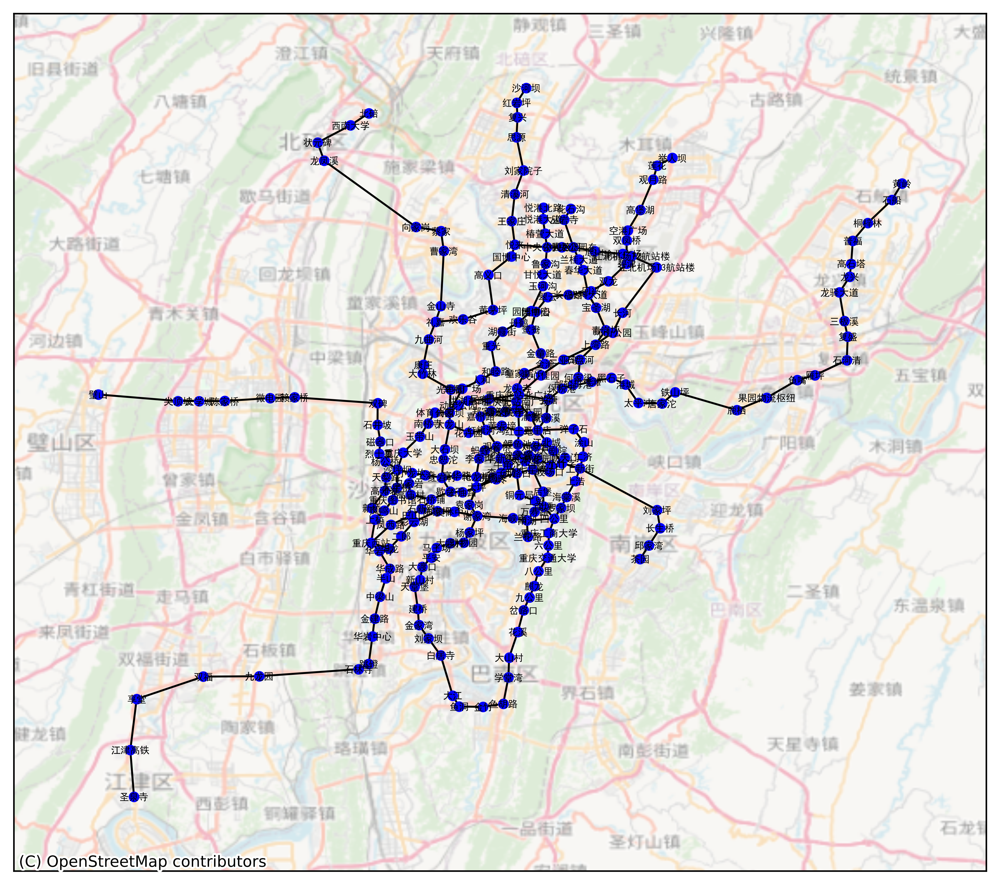

In [36]:
# plot the metro network
fig, ax = plt.subplots(figsize=(12,8), dpi=500)
nx.draw_networkx(G,
                 pos=dic,
                 with_labels=True,
                 font_family='SimHei',
                 node_size=20,
                 font_size=5,
                 font_color='black',
                 font_weight='bold',
                 node_color='blue',
                 edge_color='black',
                 ax=ax)
cx.add_basemap(ax, crs=metro_sts.crs.to_string(), 
               source=cx.providers.OpenStreetMap.Mapnik,
               alpha=0.5)

In [37]:
degree_c = nx.degree_centrality(G)
betweenness_c = nx.betweenness_centrality(G,weight='distance')
closeness_c = nx.closeness_centrality(G)
#joblib.dump({'degree_c':degree_c,'betweenness_c':betweenness_c,'closeness_c':closeness_c}, 'D:/CASApre/CASA06DSSS_assessment/data/centrality.joblib')

In [38]:
# takes two minutes
## already saved and push to github
## here we skip this part
'''
osm_fl = 'D:/CASApre/CASA06DSSS_assessment/data/map.osm'
net= og.getNetFromFile(osm_fl)
net

'''

"\nosm_fl = 'D:/CASApre/CASA06DSSS_assessment/data/map.osm'\nnet= og.getNetFromFile(osm_fl)\nnet\n\n"

In [39]:
'''
og.outputNetToCSV(net)
'''

'\nog.outputNetToCSV(net)\n'

In [40]:
link = pd.read_csv('https://github.com/yiyansun/spatial-ds/raw/main/data/link.csv')
node = pd.read_csv('https://github.com/yiyansun/spatial-ds/raw/main/data/node.csv')

In [41]:
gs = gpd.GeoSeries.from_wkt(link['geometry'])
rds = gpd.GeoDataFrame(link[['link_id','length','from_node_id','to_node_id']], geometry=gs, crs='epsg:4326')

gs= gpd.points_from_xy(node['x_coord'], node['y_coord'])
pts = gpd.GeoDataFrame(node[['node_id']], geometry=gs, crs='epsg:4326')

<Axes: >

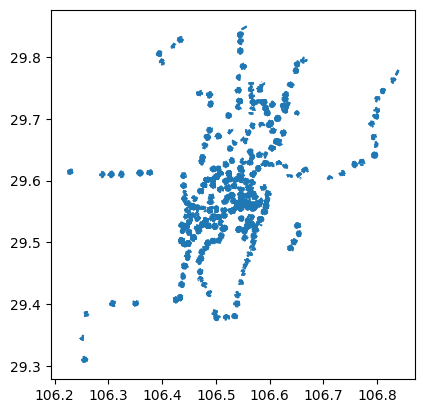

In [42]:
final_msa=final_msa.to_crs(4326)
rds2 = rds.overlay(final_msa, how='intersection')

rds2.plot()

In [43]:
link_rd = rds2[['link_id','length','from_node_id','to_node_id']]
# link_rd.to_csv('link_rd.csv', index=False)
G = nx.from_pandas_edgelist(link_rd, 
                            source='from_node_id', 
                            target='to_node_id', 
                            edge_attr=['link_id','length'])

In [44]:
# skip the process below to run this file quickly
# already saved the out and push it to github
# in the analysis part, will re-read all the saved data from github
# to look at the full code and result, check the code_full.ipynb in the github

'''%%time
## takes 6 mins
out = nx.betweenness_centrality(G, weight='distance')'''

"%%time\n## takes 6 mins\nout = nx.betweenness_centrality(G, weight='distance')"

Regional urban development is facilitated by well-maintained streets. Public transport accessibility measures were derived from several spatial data sources, which was calculated using the proportion of streets in an MSA having betweenness values in the top 30%. 

In [45]:
'''top30 = int(len(out)*0.3)
top30

node_bt = pd.DataFrame(out, index=[0]).T.sort_values(by=0, ascending=False)
node_bt.reset_index()[0].plot()'''

'top30 = int(len(out)*0.3)\ntop30\n\nnode_bt = pd.DataFrame(out, index=[0]).T.sort_values(by=0, ascending=False)\nnode_bt.reset_index()[0].plot()'

In [46]:
'''node_30p = node_bt.head(top30).index'''

'node_30p = node_bt.head(top30).index'

In [47]:
'''# find which msa the node belong
ptsx = pts[pts['node_id'].isin(node_30p)]
result = gpd.sjoin(final_msa, ptsx,predicate='contains')

final_street_bt = (result.groupby(by='MSA')['node_id'].count() / top30).reset_index().sort_values(by='node_id').rename(columns={'node_id':'bt_30'})
final_street_bt.to_csv('data/street_accessibility.csv', index=False)'''

"# find which msa the node belong\nptsx = pts[pts['node_id'].isin(node_30p)]\nresult = gpd.sjoin(final_msa, ptsx,predicate='contains')\n\nfinal_street_bt = (result.groupby(by='MSA')['node_id'].count() / top30).reset_index().sort_values(by='node_id').rename(columns={'node_id':'bt_30'})\nfinal_street_bt.to_csv('data/street_accessibility.csv', index=False)"

### 5.3 Transit Accessibility

In [48]:

# time to cbd
metrocbd = pd.read_csv('https://github.com/yiyansun/spatial-ds/raw/main/data/od_metro2cbd_result.csv')
metrocbd['from1'] = metrocbd['from'].apply(lambda x: x.split(',')[0])
metrocbd['from2'] = metrocbd['from'].apply(lambda x: x.split(',')[1])
metrocbd['from1'] = metrocbd['from1'].apply(lambda x: re.sub(r'[^\u4e00-\u9fa5]', '', x))
metrocbd['from2'] = metrocbd['from2'].apply(lambda x: re.sub(r'[^\u4e00-\u9fa5]', '', x))
metrocbd

,distance,walking_distance,duration,from,to,from1,from2
0,821,0,298,"['悦港北路', '悦港大道']",解放碑,悦港北路,悦港大道
1,821,0,298,"['悦港北路', '悦港大道']",江北嘴,悦港北路,悦港大道
2,821,0,298,"['悦港北路', '悦港大道']",弹子石,悦港北路,悦港大道
3,1146,0,321,"['悦港大道', '椿萱大道']",解放碑,悦港大道,椿萱大道
4,1146,0,321,"['悦港大道', '椿萱大道']",江北嘴,悦港大道,椿萱大道
...,...,...,...,...,...,...,...
931,1665,0,374,"['重庆西站', '华龙']",江北嘴,重庆西站,华龙
932,1665,0,374,"['重庆西站', '华龙']",弹子石,重庆西站,华龙
933,1630,0,370,"['华龙', '二郎']",解放碑,华龙,二郎
934,1630,0,370,"['华龙', '二郎']",江北嘴,华龙,二郎


In [49]:
time_to_cbd = metrocbd.groupby(by='from1')['duration'].mean().reset_index()
time_to_cbd.columns = ['MSA','duration']
time_to_cbd.head(2)

,MSA,duration
0,七星岗,346.0
1,万寿路,1323.0


### 5.4 Station Characteristis

In [50]:
# identify if inside CBD or if as tranfer station or not
cbd = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/cbd.geojson')
final_msa['geometry']=final_msa['geometry'].representative_point()
is_cbd = gpd.sjoin(final_msa,cbd,predicate='within')['MSA'].unique()
is_cbd

array([0], dtype=int64)

In [51]:
num=final_msa['MSA'].value_counts()
is_interchange = num[num > 1].index
is_interchange


Index([0], dtype='int64', name='MSA')

In [53]:
final_msa['is_cbd'] = final_msa['MSA'].apply(lambda x: 1 if x in is_cbd else 0)
final_msa['is_interchange'] = final_msa['MSA'].apply(lambda x: 1 if x in is_interchange else 0)

is_cbd_is_inter = final_msa[['MSA','is_cbd','is_interchange']]

db = {'bus_sts_num':bus_sts_num, 
      'time_to_cbd':time_to_cbd, 
      'is_cbd_is_inter':is_cbd_is_inter}

# joblib.dump(db, 'data/bus_t_i.joblib')

<a id="ID_analyse"></a>
| [1.0 Intro](#ID_intr) | [2.0 Research Question](#ID_quest) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |

## 6.0 | Analysis

### 6.1 GBDT Model

In [54]:
# final_msa 
y = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/final_msa.geojson')
# house price
x1 = pd.read_csv('https://github.com/yiyansun/spatial-ds/raw/main/data/final_housing.csv')
#
x2 = pd.read_csv('https://github.com/yiyansun/spatial-ds/raw/main/data/street_accessibility.csv')

#
url3 = 'https://github.com/yiyansun/spatial-ds/raw/main/data/bus_t_i.joblib'
local_path3 = 'bus_t_i.joblib'
urllib.request.urlretrieve(url3, local_path3)

x3 = joblib.load(local_path3)

# centrality
url4 = 'https://github.com/yiyansun/spatial-ds/raw/main/data/centrality.joblib'
local_path4 = 'centrality.joblib'
urllib.request.urlretrieve(url4, local_path4)

x4 = joblib.load(local_path4)

In [55]:
y = y[['MSA','poi_count']]
y

,MSA,poi_count
0,朝天门,4601.0
1,小什字,24518.0
2,较场口,27656.0
3,七星岗,13613.0
4,两路口,12297.0
...,...,...
321,华龙,2342.0
322,重庆西站,1056.0
323,上桥,2110.0
324,凤鸣山,3520.0


In [56]:
data = y.merge(x1, how='left').merge(x2, how='left').\
    merge(x3['bus_sts_num'], how='left').\
    merge(x3['time_to_cbd'], how='left').\
    merge(x3['is_cbd_is_inter'], how='left')
data['degree_c'] = data['MSA'].map(x4['degree_c'])
data['betweenness_c'] = data['MSA'].map(x4['betweenness_c'])
data['closeness_c'] = data['MSA'].map(x4['closeness_c'])

data = data.drop_duplicates(subset='MSA')
data = data.dropna(subset=['price'])
data.head(1)

,MSA,poi_count,Unnamed: 0,price,bt_30,bus_sts_num,duration,is_cbd,is_interchange,degree_c,betweenness_c,closeness_c
0,朝天门,4601.0,120.0,11126.63,0.015412,32,349.0,0,0,0.004082,0.0,0.078526


In [57]:
y_new = data[['poi_count']]
x = data.iloc[:, 2:]

y_new = (np.log(y_new)).round(2)

In [58]:
cov_col = ['price','bt_30','bus_sts_num','duration',
           'degree_c','betweenness_c','closeness_c']

minmax_scaler = MinMaxScaler()
to_trans =  x[cov_col]
df_scalar = minmax_scaler.fit_transform(to_trans)
X_new = pd.DataFrame(np.c_[df_scalar,x[['is_cbd','is_interchange']]],
                         columns = cov_col+['is_cbd','is_interchange'])
X_new = X_new.round(2)

In [59]:

# rename columns
X_new.columns = ['house_price', 'street_access', 'num_busstations','time_to_CBD', 'degree_c', 'betweenness_c', 'metro', 'cbd_or_not', 'interchange_or_not']

X_new

,house_price,street_access,num_busstations,time_to_CBD,degree_c,betweenness_c,metro,cbd_or_not,interchange_or_not
0,0.42,0.19,0.05,0.09,0.0,0.00,0.71,0.0,0.0
1,0.41,0.56,0.16,0.10,0.6,0.21,0.82,0.0,1.0
2,0.43,0.29,0.28,0.10,0.4,0.18,0.82,1.0,1.0
3,0.37,0.23,0.33,0.09,0.6,0.90,0.88,0.0,1.0
4,0.37,0.39,0.34,0.11,0.6,0.15,0.92,0.0,1.0
...,...,...,...,...,...,...,...,...,...
235,0.34,0.16,0.36,0.08,0.2,0.10,0.69,0.0,1.0
236,0.41,0.20,0.31,0.07,0.2,0.09,0.63,0.0,1.0
237,0.42,0.33,0.22,0.08,0.2,0.08,0.58,0.0,1.0
238,0.36,0.19,0.14,0.10,0.2,0.08,0.56,0.0,1.0


In [99]:
X_new = X_new.replace([np.inf, -np.inf], np.nan).dropna()
# Calculate the VIF for each independent variable
vif = pd.DataFrame()
vif["variables"] = X_new.columns.dropna()
vif["VIF"] = [variance_inflation_factor(X_new.values, i) for i in range(X_new.shape[1])]

print(vif)

            variables        VIF
0               const  27.151444
1         house_price   1.303065
2       street_access   2.205629
3     num_busstations   2.552054
4         time_to_CBD   1.295240
5            degree_c   2.830720
6       betweenness_c   1.708068
7               metro   1.253883
8          cbd_or_not   1.105080
9  interchange_or_not   1.967797


<Axes: >

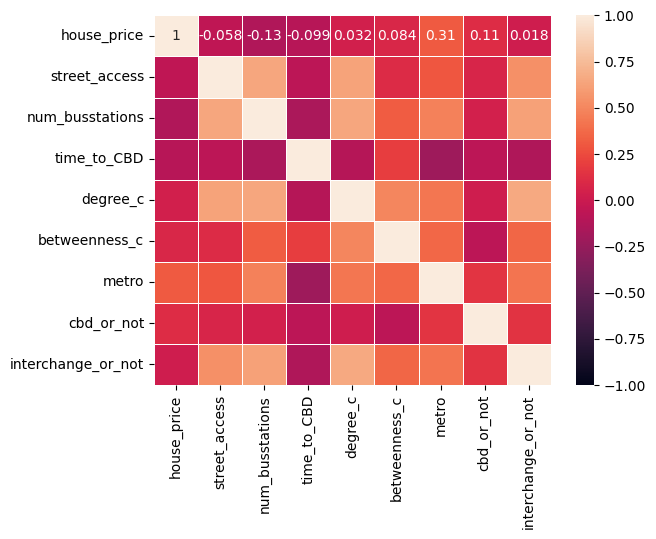

In [60]:
sns.heatmap(X_new.corr(), annot=True,
            linecolor='white',linewidths=0.5,
            vmin=-1,vmax=1)


The GBDT model is built with LightGBM. The number of POIs is set as a dependent variable, and station attributes, accessibility to public transportation, and control variables are set as independent variables.

In [61]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X_new, 
    y_new,
    test_size=0.2, 
    random_state=1,
    shuffle=True)

In [62]:
# Train the initial model with default hyperparameters (LightGBM)
model = LGBMRegressor()
# Get the default parameters of the model
model.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

In [63]:
# Fit the model on the training data
model.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000653 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 206
[LightGBM] [Info] Number of data points in the train set: 192, number of used features: 8
[LightGBM] [Info] Start training from score 6.762344
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

LGBMRegressor()

In [64]:
# Evaluate the model's performance on the training set
model.score(X_train, y_train)

0.938950253405488

In [65]:
# Evaluate the model's performance on the test set
model.score(X_test, y_test)

0.8319936573740734

In [66]:
# Define the hyperparameters grid for hyperparameter tuning
params = {'num_leaves': [2,4,6,8,10],
          'n_estimators': [5,10,100,200,300,400,500,1000],
          'min_child_samples': [5,10,20,30]}

In [67]:
# Perform grid search cross-validation to find the best hyperparameters
grid_search = GridSearchCV(estimator=model, param_grid=params, cv=5, refit=True, verbose=False)

In [68]:
grid_search.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 153, number of used features: 9
[LightGBM] [Info] Start training from score 6.910196
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000079 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 185
[LightGBM] [Info] Number of data points in the train set: 153, number of used features: 9
[LightGBM] [Info] Start training from score 6.741111
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you c

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 185
[LightGBM] [Info] Number of data points in the train set: 153, number of used features: 9
[LightGBM] [Info] Start training from score 6.741111
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 178
[LightGBM] [Info] Number of data points in the train set: 154, number of used features: 9
[LightGBM] [Info] Start training from score 6.740779
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000095 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 187
[

GridSearchCV(cv=5, estimator=LGBMRegressor(),
             param_grid={'min_child_samples': [5, 10, 20, 30],
                         'n_estimators': [5, 10, 100, 200, 300, 400, 500, 1000],
                         'num_leaves': [2, 4, 6, 8, 10]},
             verbose=False)

In [69]:
grid_search.best_params_

{'min_child_samples': 5, 'n_estimators': 100, 'num_leaves': 2}

In [70]:
grid_search.best_score_

0.7893473721798563

In [71]:
# Update the model with the best hyperparameters found during grid search
model.set_params(**grid_search.best_params_)

LGBMRegressor(min_child_samples=5, num_leaves=2)

In [72]:
# Perform cross-validation on the updated model to get an estimate of its performance
model_cv = cross_validate(model, X_train, y_train, cv=5, verbose=3, return_estimator=True)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000083 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 153, number of used features: 9
[LightGBM] [Info] Start training from score 6.910196
[CV] END ......................................., score=0.754 total time=   0.0s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000123 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 185
[LightGBM] [Info] Number of data points in the train set: 153, number of used features: 9
[LightGBM] [Info] Start training from score 6.741111
[CV] END ......................................., score=0.767 total time=   0.0s
[LightGBM] [Info] Auto-choosing ro

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


In [73]:
# Calculate the mean test score from the cross-validation results
model_cv['test_score'].mean()

0.7893473721798563

In [74]:
final_model = model_cv['estimator'][0]

In [75]:
y_pred=final_model.predict(X_test)
y_pred

array([8.85201945, 6.41492968, 7.22042492, 5.68164274, 3.13923057,
       9.54794592, 8.01162061, 5.52007737, 7.08355371, 8.62480401,
       9.09522454, 9.49295934, 6.95847957, 7.71699667, 8.14853038,
       3.90231239, 1.88338304, 7.59251891, 8.62480401, 3.57450223,
       3.1647159 , 5.5788886 , 8.8898055 , 6.24583357, 8.96700186,
       8.51629214, 9.0972362 , 7.17032073, 9.47815598, 8.08144911,
       5.07653567, 8.35947536, 8.44771941, 4.17301447, 6.97520817,
       8.20588574, 8.29672352, 7.49251444, 2.90757972, 2.49280185,
       4.1059332 , 8.95830621, 5.94710144, 8.18619999, 8.46919204,
       7.17420507, 8.20701715, 5.81429986])

In [76]:

# Calculate predictions on the training set
y_train_pred = final_model.predict(X_train)

# Calculate predictions on the test set
y_test_pred = final_model.predict(X_test)

# Calculate MAE on training set
mae_train = mean_absolute_error(y_train, y_train_pred)

# Calculate MAE on test set
mae_test = mean_absolute_error(y_test, y_test_pred)

# Calculate RMSE on training set
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))

# Calculate RMSE on test set
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

# Calculate R-squared on training set
r2_train = r2_score(y_train, y_train_pred)

# Calculate R-squared on test set
r2_test = r2_score(y_test, y_test_pred)

# Print the results
print("Performance Metrics on Training Set:")
print("MAE:", mae_train)
print("RMSE:", rmse_train)
print("R-squared:", r2_train)
print("\nPerformance Metrics on Test Set:")
print("MAE:", mae_test)
print("RMSE:", rmse_test)
print("R-squared:", r2_test)


Performance Metrics on Training Set:
MAE: 0.6418286744215581
RMSE: 0.8320454856053067
R-squared: 0.8586739768989382

Performance Metrics on Test Set:
MAE: 0.7931616173312449
RMSE: 1.024400048148583
R-squared: 0.817162032601803


In [77]:
#loss
mean_absolute_error(y_test, y_pred)

0.7931616173312449

In [80]:
final_model.score(X_test, y_test)

0.817162032601803

In [81]:
joblib.dump(final_model, 'final_model.joblib')
joblib.dump(minmax_scaler, 'minmax_scaler.joblib')
joblib.dump({'X':X_new,
             'Y':y_new}, 'model_data_norm.joblib')


['model_data_norm.joblib']

In [83]:
data = joblib.load('model_data_norm.joblib')
x = data['X']
y = data['Y']

model performance
| Evaluating indicators             | Training set       | Test set                                                                     |
|--------------------|------------|---------------------------------------------------------------------------------|
|MAE|0.64183|0.79316|
|RMSE|0.83205|1.0244|
|R2|0.85867|0.81716|

| Best Parameters             | value       | 
|--------------------|---------------------------------------------------------------------------------|
|min_child_samples|5|
|n_estimators|100|
|num_leaves|2|
|Best Cross-Validation Score|0.7893|



### 6.2 Model Inerpretation

The mean Shap value for each variable is represented by the horizontal coordinates. The average marginal contribution of a variable over all other variables is its Shap value. The graph's left side displays the variables in decreasing order of global relevance, while the graph's right side illustrates how each MSA's variable values affect urban development.

In [93]:
explainer = shap.Explainer(model.predict,x)
shap_values = explainer(x)

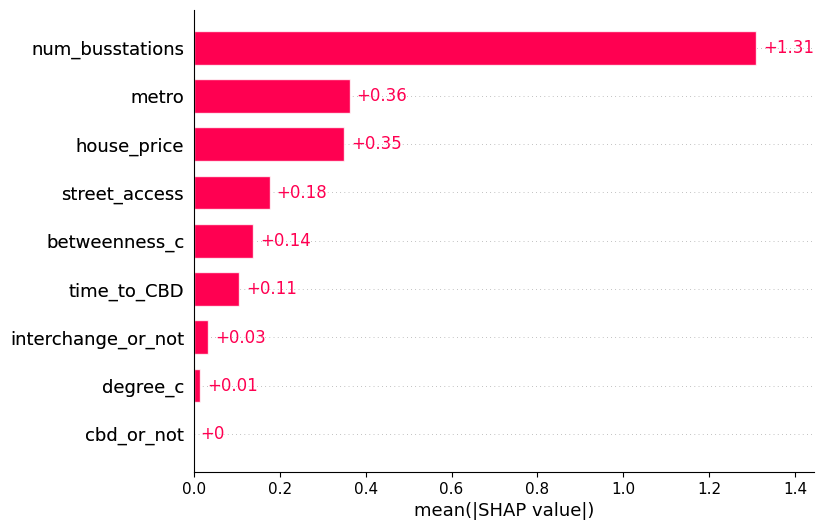

In [85]:
shap.plots.bar(shap_values)

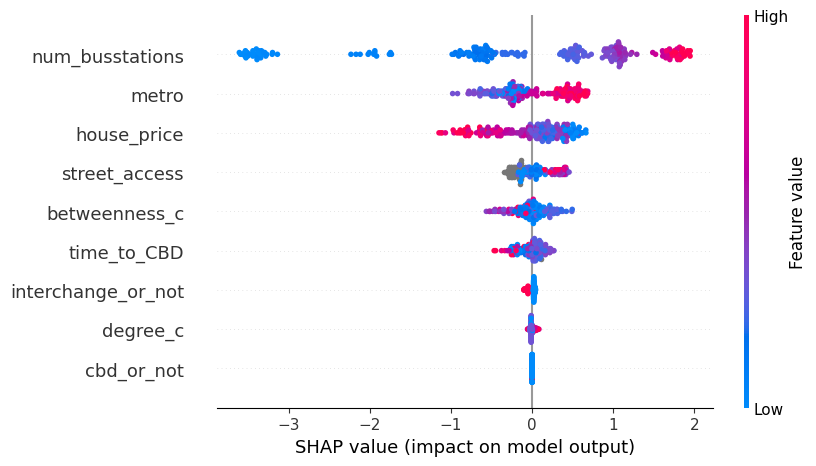

In [86]:
shap.plots.beeswarm(shap_values)

The expansion of urban areas in Chongqing is primarily driven by the density of bus stations, highlighting the crucial role of public transportation access in facilitating urban development. The significance of housing price as a variable suggests its potential influence on growth patterns within MSAs. High real estate values often reflect the attractiveness and economic vitality of a location, indicating that residential zones play a key role in urban growth. The challenging geographical terrain of Chongqing may lead to increased construction costs, potentially inflating property prices. Areas strategically planned around transit routes and amenities are likely to experience appreciation in property value.

The study's findings challenge the conventional assumption that CBDs act as the primary drivers of urban development. Instead, urban growth in Chongqing appears to be dispersed across various city nodes, indicating a decentralized pattern. Contrary to expectations, factors such as the time to CBD and their status as transfer hubs do not significantly influence urban expansion, suggesting that they may not serve as reliable indicators of development longevity or nodal activity intensity. Moreover, the evaluation of transfer station significance utilized a simplistic binary approach, and the estimation of CBD proximity focused solely on public transit, overlooking the impact of personal vehicle access. Despite the prominence of the Jiefangbei-Jiangbeizui-Danzishi district as Chongqing's development core, urban expansion extends beyond this region, demonstrating the city's diverse growth dynamics.

In [87]:
#fig, axes = plt.subplots(3, 3, figsize=(15, 15))
#axes = axes.flatten()

#for i in range(shap_values.shape[1]):
    #shap.plots.scatter(shap_values[:, i], ax=axes[i])
    #axes[i].set_title('SHAP Values for Feature {}'.format(i))

#plt.tight_layout()
#plt.show()


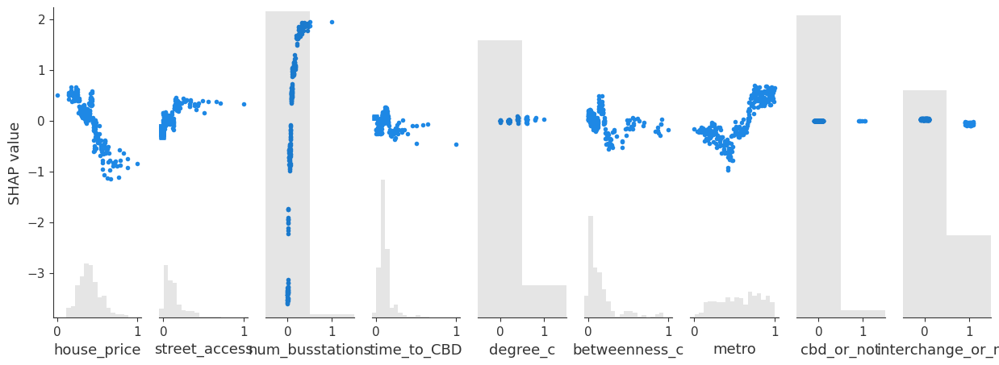

In [88]:
# plot all the scatter
shap.plots.scatter(shap_values)

Nonlinear effects of variables.

In order to determine local and global patterns of influence on accessibility variables related to public transportation, this study employs local dependence plots. An MSA is represented by each blue dot in the vignette. The eigenvalue of the variable is represented by the x-axis. The corresponding Shap value of the sample point is shown on the y-axis. Confirming the previously mentioned nonlinear relationships, the local correlation diagram demonstrates that the local effects of variables on urban development have a range of different intensities when they fall into different ranges of values.

<div style="float:right"><img width="800" src="https://github.com/yiyansun/spatial-ds/raw/main/output/shap.png" /></div>




Certain features like the number of bus stations and house prices are significant predictors of urban development in the model, while the impact of other features such as degree centrality, the CBD location, and interchange stations is limited. The variability in SHAP values across the features indicates that the relationship between these factors and urban development is complex and non-linear, with different factors having varying levels of influence on different observations.

In [89]:
shap.initjs()
shap.plots.force(shap_values)

In [90]:
shap.plots.force(shap_values[15:16])

In [91]:
shap.plots.force(shap_values[107:108])

In [92]:
shap.plots.force(shap_values[207:208])

<a id="ID_conclude"></a>
| [1.0 Intro](#ID_intr) | [2.0 Research Question](#ID_quest) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |

## 7.0 | Discussion and conclusion

According to Manout et al. (2018), transit accessibility is widely regarded as a crucial objective in the promotion of transit use and policies. Accessibility to public transportation and urban development have been linked in a number of studies (Rode et al., 2017; Zhou & Yang, 2021).  The objective of this research is to examine, through quantitative analysis, the non-linear and threshold effects of public transportation accessibility on urban development.





>Questions

> What is the relationship between public transport accessibility and urban development in mountainous cities like Chongqing?

> What are the impacts of different modes of public transport (e.g., metro, bus, street accessibility) on urban development?


The study found nonlinear and threshold effects of public transport accessibility factors like metro betweenness, street accessibility, and number of bus stops on urban development levels measured by number of POIs in metro service areas of Chongqing, as shown by local correlation plots. The threshold effects of the variables on urban development make it difficult to characterize nearly all of the variables with significant effects with a smooth straight line. The rate of increase of variables is affected by their local facilitating (or inhibiting) effects when they are above (or below) the threshold point. Governmental organizations and departments in charge of transportation planning may find these nonlinear and threshold effects to be helpful resources when creating policies.

The Chongqing MSAs' urban development can benefit greatly from public transportation accessibility. The results show that street accessibility, bus services, and sufficient metro services are critical for encouraging urban development,while the key elements influencing the importance of street accessibility are probably improved topography and accessibility. Factors like CBD effect, interchange station status had a weaker influence on urban development in the mountainous city.

Limitation

Since there is a lack of data specifically for mountainous cities, the accessibility and transport characteristics used in the study, which were adapted from earlier research on plain cities, might not be applicable there. Furthermore, the study's definition of "MSA" is based on conventional circular areas, which might not be suitable for hilly cities with erratic road systems. Future research could address these limitations by establishing a more varied system for evaluating accessibility characteristics based on the unique features of road networks and pedestrian systems in mountainous cities, as well as by using social media check-in data and other forms of data to obtain more accurate POI data.


<a id="ID_biblio"></a>
| [1.0 Intro](#ID_intr) | [2.0 Research Question](#ID_quest) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |


***
## Bibliography



Calthorpe, P. (1993). ‘The next American metropolis’. New York: Princeton Architectural Press, Vol. 23.

Dong, H. (2016). ‘If You Build Rail Transit in Suburbs, Will Development Come?’ Journal of the American Planning Association. Routledge, 82 (4), pp. 316–326. doi: 10.1080/01944363.2016.1215258.

Gong, S. (2021). ‘Evaluating healthcare resource inequality in Beijing, China based on an improved spatial accessibility measurement’. Transactions in GIS. Available at: https://onlinelibrary.wiley.com/doi/full/10.1111/tgis.12737.

Hickman, R. and Hall, P. (2008). ‘Moving the City East: Explorations into Contextual Public Transport-orientated Development’. Planning Practice & Research. Routledge, 23 (3), pp. 323–339. doi: 10.1080/02697450802423583.
Hurst, N. (2011). ‘How Does Light Rail Transit Affect Urban Land Use?’ Economics Honors Projects. Available at: https://digitalcommons.macalester.edu/economics_honors_projects/35.

Kamruzzaman, Md., Baker, D., Washington, S. and Turrell, G. (2014). ‘Advance transit oriented development typology: case study in Brisbane, Australia’. Journal of Transport Geography, 34, pp. 54–70. doi: 10.1016/j.jtrangeo.2013.11.002.

Knowles, R. D. (2012). ‘Transit Oriented Development in Copenhagen, Denmark: from the Finger Plan to Ørestad’. Journal of Transport Geography. (Special Section on Rail Transit Systems and High Speed Rail), 22, pp. 251–261. doi: 10.1016/j.jtrangeo.2012.01.009.

Rode, P., Floater, G., Thomopoulos, N., Docherty, J., Schwinger, P., Mahendra, A. and Fang, W. (2017). ‘Accessibility in Cities: Transport and Urban Form’. in Meyer, G. and Shaheen, S. (eds) Disrupting Mobility: Impacts of Sharing Economy and Innovative Transportation on Cities. Cham: Springer International Publishing, pp. 239–273. doi: 10.1007/978-3-319-51602-8_15.

Sharma, G. and Patil, G. R. (2022). ‘Spatial and social inequities for educational services accessibility - A case study for schools in Greater Mumbai’. Cities, 122, p. 103543. doi: 10.1016/j.cities.2021.103543.

Wang, G., Zhong, Y., Teo, C.-P. and Liu, Q. (2015). ‘Flow-based accessibility measurement: The Place Rank approach’. Transportation Research Part C: Emerging Technologies, 56, pp. 335–345. doi: 10.1016/j.trc.2015.04.017.

Xiao, L., Lo, S., Liu, J., Zhou, J. and Li, Q. (2021). ‘Nonlinear and synergistic effects of TOD on urban vibrancy: Applying local explanations for gradient boosting decision tree’. Sustainable Cities and Society, 72, p. 103063. doi: 10.1016/j.scs.2021.103063.

Xu, W. (Ato) and Yang, L. (2019). ‘Evaluating the urban land use plan with transit accessibility’. Sustainable Cities and Society, 45, pp. 474–485. doi: 10.1016/j.scs.2018.11.042.

Zhou, J. and Yang, Y. (2021). ‘Transit-based accessibility and urban development: An exploratory study of Shenzhen based on big and/or open data’. Cities, 110, p. 102990. doi: 10.1016/j.cities.2020.102990.



<a id="ID_append"></a>
| [1.0 Intro](#ID_intr) | [2.0 Research Question](#ID_quest) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |

## Appendix

in case jupyter lab cannot use shap.initjs() command, put the output graphs here

<div style="float:right"><img width="600" src="https://github.com/yiyansun/spatial-ds/raw/main/output/sample_outputvalue.png" /></div>


<div style="float:right"><img width="600" src="https://github.com/yiyansun/spatial-ds/raw/main/output/original_order.png" /></div>

<div style="float:right"><img width="600" src="https://github.com/yiyansun/spatial-ds/raw/main/output/similarity.png" /></div>

<div style="float:right"><img width="600" src="https://github.com/yiyansun/spatial-ds/raw/main/output/15.png" /></div>

<div style="float:right"><img width="600" src="https://github.com/yiyansun/spatial-ds/raw/main/output/107.png" /></div>